In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from matplotlib.colors import ListedColormap

In [3]:
df1 = pd.read_csv('/Users/antoniobaio/Desktop/Progetti/ProgettiDS/BI/Olympics/dataset_original/athlete_events.csv')
df2 = pd.read_csv('/Users/antoniobaio/Desktop/Progetti/ProgettiDS/BI/Olympics/dataset_original/noc_regions.csv')
population = pd.read_csv('/Users/antoniobaio/Desktop/Progetti/ProgettiDS/BI/Olympics/dataset_original/population.csv')


In [3]:
population.head()

,Country name,Year,Population,Population of children under the age of 1,Population of children under the age of 5,Population of children under the age of 15,Population under the age of 25,Population aged 15 to 64 years,Population older than 15 years,Population older than 18 years,...,Population aged 15 to 19 years,Population aged 20 to 29 years,Population aged 30 to 39 years,Population aged 40 to 49 years,Population aged 50 to 59 years,Population aged 60 to 69 years,Population aged 70 to 79 years,Population aged 80 to 89 years,Population aged 90 to 99 years,Population older than 100 years
0,Afghanistan,1950,7480464,301735.0,1248282,3068855,4494349,4198587,4411609,3946595,...,757113,1241348,909953,661807,467170,271905,92691,9499,123,0.0
1,Afghanistan,1951,7571542,299368.0,1246857,3105444,4552138,4250002,4466098,3993640,...,768616,1260904,922765,667015,468881,273286,94358,10155,118,0.0
2,Afghanistan,1952,7667534,305393.0,1248220,3145070,4613604,4303436,4522464,4041439,...,781411,1280288,935638,672491,470898,274852,96026,10721,139,0.0
3,Afghanistan,1953,7764549,311574.0,1254725,3186382,4676232,4356242,4578167,4088379,...,794308,1298803,948321,678064,472969,276577,97705,11254,166,0.0
4,Afghanistan,1954,7864289,317584.0,1267817,3231060,4741371,4408474,4633229,4136116,...,806216,1316768,961484,684153,475117,278210,99298,11793,190,0.0


In [7]:
population.drop(population.iloc[:, 3:], inplace=True, axis=1)
population = population[population['Year'].isin(df1['Year'].unique())]

population.rename(columns={'Country Name': 'Country'}, inplace=True) 

population.head()

,Country name,Year,Population
2,Afghanistan,1952,7667534
6,Afghanistan,1956,8087730
10,Afghanistan,1960,8622473
14,Afghanistan,1964,9355510
18,Afghanistan,1968,10247782


In [8]:
population.rename(columns={'Country name': 'Country'}, inplace=True) 

In [9]:
population.head()

,Country,Year,Population
2,Afghanistan,1952,7667534
6,Afghanistan,1956,8087730
10,Afghanistan,1960,8622473
14,Afghanistan,1964,9355510
18,Afghanistan,1968,10247782


**Eliminazione olimpiadi invernali**

In [10]:
df1.head(5)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [8]:
df2.head(5)

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN


In [11]:
# drop colonna notes
df2 = df2.drop(['notes'], axis=1)
df2.head(5)

,NOC,region
0,AFG,Afghanistan
1,AHO,Curacao
2,ALB,Albania
3,ALG,Algeria
4,AND,Andorra


In [12]:
data = pd.merge(df1, df2, on="NOC", how="left")
data.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands


In [13]:
data.rename(columns={'region':'Country'}, inplace=True)
data.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Country
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands


In [15]:
data.replace('USA', "United States of America", inplace = True)
data.replace('Tanzania', "United Republic of Tanzania", inplace = True)
data.replace('Democratic Republic of Congo', "Democratic Republic of the Congo", inplace = True)
data.replace('Congo', "Republic of the Congo", inplace = True)
data.replace('Lao', "Laos", inplace = True)
data.replace('Syrian Arab Republic', "Syria", inplace = True)
data.replace('Serbia', "Republic of Serbia", inplace = True)
data.replace('Czechia', "Czech Republic", inplace = True)
data.replace('UAE', "United Arab Emirates", inplace = True)
data.replace('UK', "United Kingdom", inplace = True)

In [17]:
data['Medal'].fillna('No Medal', inplace=True)
data.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Country
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,No Medal,China
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,No Medal,China
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,No Medal,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,No Medal,Netherlands


In [18]:
# drop  dati nulli
data.isna().sum()

ID             0
Name           0
Sex            0
Age         9474
Height     60171
Weight     62875
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal          0
Country      370
dtype: int64

In [19]:
missing_percentage= round(100*(data.isna().sum().sort_values(ascending=False)/len(data)), 2)
missing_percentage[missing_percentage!=0]

Weight     23.19
Height     22.19
Age         3.49
Country     0.14
dtype: float64

In [20]:
data.dropna(subset=['Country'], inplace=True)

data['Age'].fillna(value = data['Age'].mean().round(), inplace=True)

data['Height'].fillna(value = data['Height'].mean().round(), inplace=True)
data['Weight'].fillna(value = data['Weight'].mean().round(), inplace=True)

data['Country'].fillna(value="Region Unknown",inplace=True)


In [21]:
data.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Country
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,No Medal,China
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,No Medal,China
2,3,Gunnar Nielsen Aaby,M,24.0,175.0,71.0,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,No Medal,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,175.0,71.0,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,No Medal,Netherlands


**SOstituzione dati nulli con "medaglia non vinta"**

In [49]:
data.to_csv("./athletes_noc2.csv")

In [22]:
data.to_excel("./athletes_noc2.xlsx")

In [50]:
summer = df1[df1["Season"] == "Summer"]
summer.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
26,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NaN


In [51]:
winter = df1[df1["Season"] == "Winter"]
winter.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN
5,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,"Speed Skating Women's 1,000 metres",NaN
6,5,Christine Jacoba Aaftink,F,25.0,185.0,82.0,Netherlands,NED,1992 Winter,1992,Winter,Albertville,Speed Skating,Speed Skating Women's 500 metres,NaN
7,5,Christine Jacoba Aaftink,F,25.0,185.0,82.0,Netherlands,NED,1992 Winter,1992,Winter,Albertville,Speed Skating,"Speed Skating Women's 1,000 metres",NaN
8,5,Christine Jacoba Aaftink,F,27.0,185.0,82.0,Netherlands,NED,1994 Winter,1994,Winter,Lillehammer,Speed Skating,Speed Skating Women's 500 metres,NaN


In [52]:
summer.to_csv("./summer.csv")
winter.to_csv("./winter.csv")

## DATA VISUALIZATION

In [15]:
from wordcloud import WordCloud

**Grafico con nazioni che hanno più atleti**

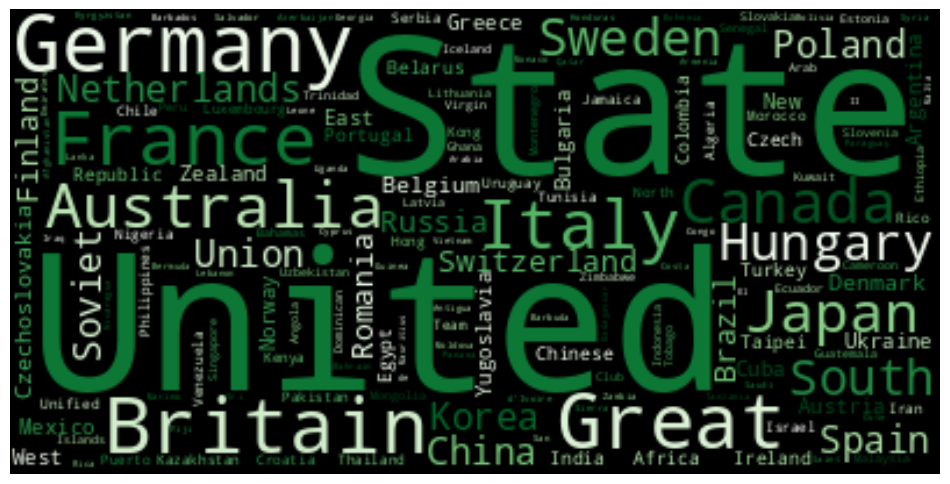

In [33]:
countries = " ".join(n for n in data["Team"])

plt.figure(figsize=(12, 11))
wc = WordCloud(background_color='black',colormap='Greens',collocations=False).generate(countries)
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

In [16]:
count = data["Team"].value_counts()
count.head(10)


United States    14277
Great Britain    10169
France            9850
Italy             8004
Germany           7282
Australia         6975
Canada            6636
Japan             6213
Hungary           6034
Sweden            5773
Name: Team, dtype: int64

**Differenze di età degli atleti**

Text(0.5, 1.0, 'Age distribution by year')

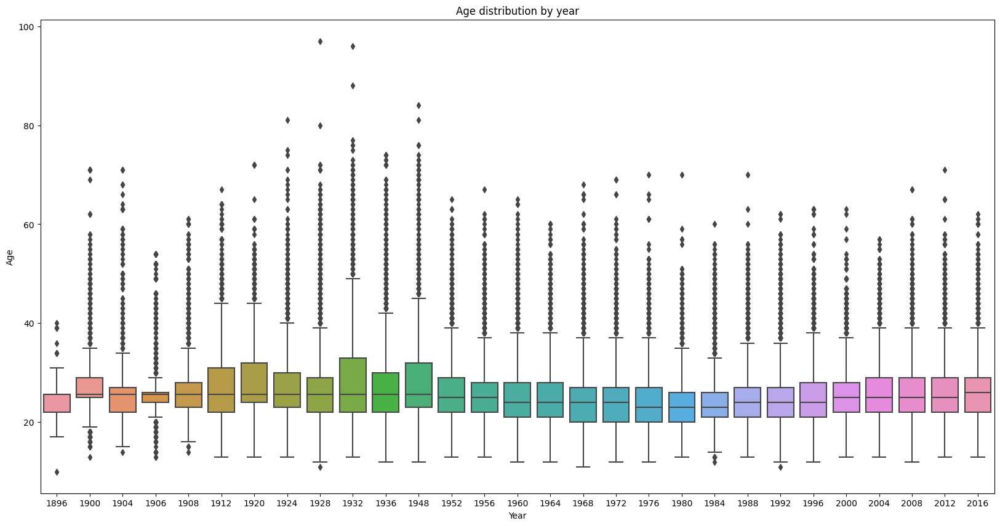

In [17]:
# boxplot for age and year
plt.figure(figsize=(20, 10))
sns.boxplot(x="Year", y="Age", data=data)
plt.title("Age distribution by year")

In [18]:
line_colors = ["#14cc60", "#036d19", "#09a129"]
fig = px.box(data, x="Year", y="Age", title="<b>L'andamento generale dell'età degli atleti</b>",
             color_discrete_sequence=line_colors, template="none")
fig.update_layout(plot_bgcolor=" whitesmoke"
                  )
fig.show()


**Vediamo che l'età mediana degli atleti è stata di circa 25 anni per la maggior parte dei giochi olimpici nell'arco di 100 anni.**

**Conteggio atleti**

In [19]:
# trend of athletes over the years, count of athletes and group by year

trend = data.groupby("Year").count()["ID"].reset_index()
trend.rename(columns={"ID": "Count"}, inplace=True)
trend.head()

,Year,Count
0,1896,380
1,1900,1898
2,1904,1301
3,1906,1733
4,1908,3069


**Variazione atleti negli anni**

In [20]:
line_colors = ["#14cc60", "#036d19", "#09a129"]
fig = px.line(trend, x='Year', y='Count', title="<b>La variazione dei partecipanti nel corso degli anni</b>",
              markers=True, color_discrete_sequence=line_colors, template="none")
fig.update_layout(plot_bgcolor=" whitesmoke")
fig.show()


**Variazione delle atlete donne nel corso degli anni**

In [21]:
## Variazione delle atlete donne nel corso degli anni

female = data[data["Sex"] == "F"]
female.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region
4,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,25.674053,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,Medal Not Won,Netherlands
5,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,25.674053,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 4 x 100 metres Relay,Medal Not Won,Netherlands
8,13,Minna Maarit Aalto,F,30.0,159.0,55.500000,Finland,FIN,1996 Summer,1996,Summer,Atlanta,Sailing,Sailing Women's Windsurfer,Medal Not Won,Finland
9,13,Minna Maarit Aalto,F,34.0,159.0,55.500000,Finland,FIN,2000 Summer,2000,Summer,Sydney,Sailing,Sailing Women's Windsurfer,Medal Not Won,Finland
33,21,Ragnhild Margrethe Aamodt,F,27.0,163.0,25.674053,Norway,NOR,2008 Summer,2008,Summer,Beijing,Handball,Handball Women's Handball,Gold,Norway


Text(0, 0.5, 'Numero di medaglie')

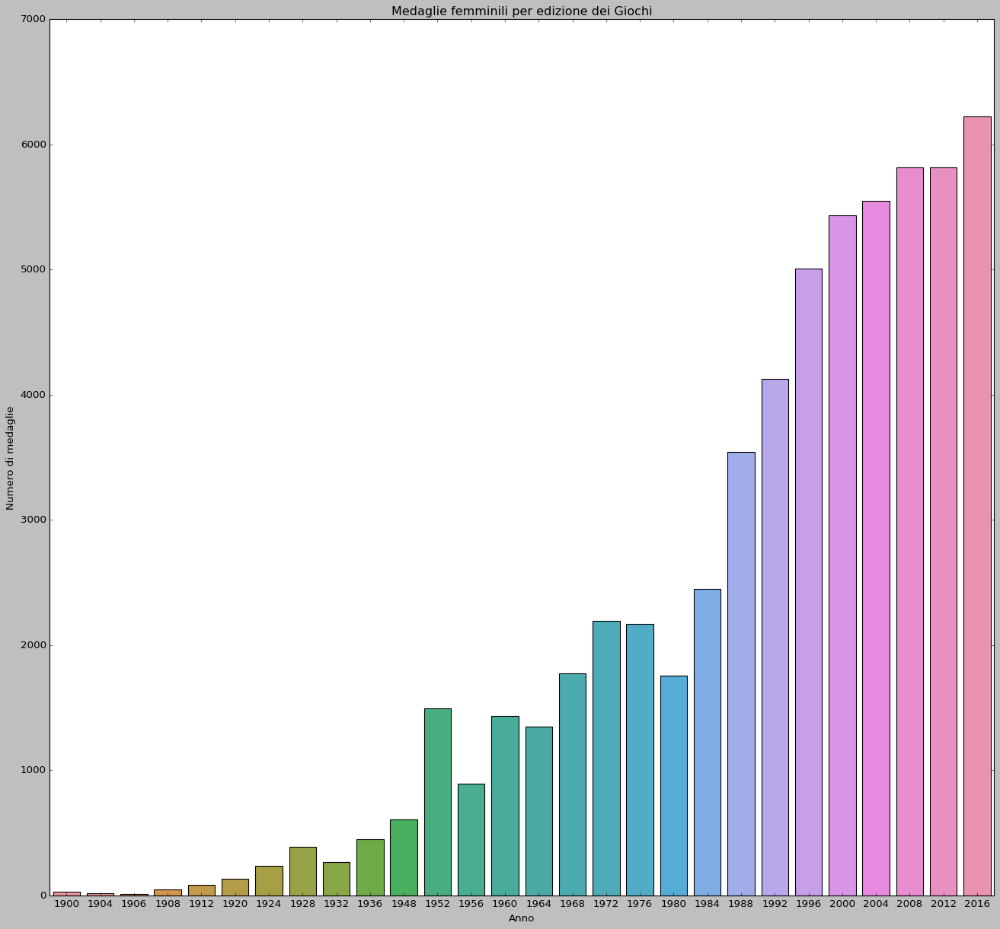

In [27]:
plt.style.use(['classic'])
plt.figure(figsize=(20,18))
sns.countplot(x='Year', data=female)
plt.title('Medaglie femminili per edizione dei Giochi')
plt.xlabel('Anno')
plt.ylabel('Numero di medaglie')

In [23]:
## variation of female partecipants in comparison to male partecipans over the years
gender = data.groupby(["Sex", "Year"]).count().reset_index()
gender.head()

,Sex,Year,ID,Name,Age,Height,Weight,Team,NOC,Games,Season,City,Sport,Event,Medal,region
0,F,1900,33,33,33,33,33,33,33,33,33,33,33,33,33,33
1,F,1904,16,16,16,16,16,16,16,16,16,16,16,16,16,16
2,F,1906,11,11,11,11,11,11,11,11,11,11,11,11,11,11
3,F,1908,47,47,47,47,47,47,47,47,47,47,47,47,47,47
4,F,1912,87,87,87,87,87,87,87,87,87,87,87,87,87,87


In [25]:
line_colors = ["#0a2e36", '#27fb6b']
a = px.line(gender, x="Year", y="ID", color='Sex', markers=True,
            color_discrete_sequence=line_colors, template="none")
a.update_layout(plot_bgcolor="whitesmoke",
                title="<b>Andamento dei partecipanti maschili e femminili nel corso degli anni</b>",
                yaxis_title="Numero di partecipanti",
                xaxis_title="Anno"
                )
a.show()


In [30]:
plot = px.scatter(data, x="Height", y="Weight", size="Age", color='Sport',
                  title="<b>Variazione di altezza e peso rispetto all'età negli sport</b>")
plot.update_layout(plot_bgcolor="White", autosize=True)
plot.show()


In [31]:
# top 10 to win gold, silver and bronze medals
medal = data[data["Medal"] == "Gold"].groupby(
    "Team").count().sort_values(by="ID", ascending=False).reset_index()
medal.head(10)


,Team,ID,Name,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Sport,Event,Medal,region
0,United States,2333,2333,2333,2333,2333,2333,2333,2333,2333,2333,2333,2333,2333,2333,2333
1,Soviet Union,830,830,830,830,830,830,830,830,830,830,830,830,830,830,830
2,Germany,564,564,564,564,564,564,564,564,564,564,564,564,564,564,564
3,Italy,492,492,492,492,492,492,492,492,492,492,492,492,492,492,492
4,Great Britain,481,481,481,481,481,481,481,481,481,481,481,481,481,481,481
5,Hungary,432,432,432,432,432,432,432,432,432,432,432,432,432,432,432
6,France,421,421,421,421,421,421,421,421,421,421,421,421,421,421,421
7,East Germany,337,337,337,337,337,337,337,337,337,337,337,337,337,337,337
8,Australia,336,336,336,336,336,336,336,336,336,336,336,336,336,336,336
9,Sweden,326,326,326,326,326,326,326,326,326,326,326,326,326,326,326


In [32]:
line_colors = ["#0a2e36", "#27FB6B", "#14cc60", "#036d19", "#09a129"]
gold_plot = px.pie(medal.head(10), values='ID', hole=0.6, names='Team',
                   title='<b>Top 10 delle nazioni vincitrici di oro</b>', color_discrete_sequence=line_colors, template="none")
fig.update_layout(plot_bgcolor=" whitesmoke")
gold_plot.show()


In [33]:
# top 10 to win gold, silver and bronze medals
medal = data[data["Medal"] == "Silver"].groupby(
    "Team").count().sort_values(by="ID", ascending=False).reset_index()
medal.head(10)


,Team,ID,Name,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Sport,Event,Medal,region
0,United States,1241,1241,1241,1241,1241,1241,1241,1241,1241,1241,1241,1241,1241,1241,1241
1,Soviet Union,635,635,635,635,635,635,635,635,635,635,635,635,635,635,635
2,Great Britain,576,576,576,576,576,576,576,576,576,576,576,576,576,576,576
3,Germany,513,513,513,513,513,513,513,513,513,513,513,513,513,513,513
4,France,485,485,485,485,485,485,485,485,485,485,485,485,485,485,485
5,Italy,467,467,467,467,467,467,467,467,467,467,467,467,467,467,467
6,Australia,450,450,450,450,450,450,450,450,450,450,450,450,450,450,450
7,Sweden,350,350,350,350,350,350,350,350,350,350,350,350,350,350,350
8,Hungary,328,328,328,328,328,328,328,328,328,328,328,328,328,328,328
9,China,299,299,299,299,299,299,299,299,299,299,299,299,299,299,299


In [34]:
line_colors = ["#0a2e36", "#27FB6B", "#14cc60", "#036d19", "#09a129"]
silver_plot = px.pie(medal.head(10), values='ID', hole=0.6, names='Team',
                   title='<b>Top 10 delle nazioni vincitrici di argento</b>', color_discrete_sequence=line_colors, template="none")
fig.update_layout(plot_bgcolor=" whitesmoke")
silver_plot.show()

In [35]:
# top 10 to win gold, silver and bronze medals
medal = data[data["Medal"] == "Bronze"].groupby(
    "Team").count().sort_values(by="ID", ascending=False).reset_index()
medal.head(10)

,Team,ID,Name,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Sport,Event,Medal,region
0,United States,1112,1112,1112,1112,1112,1112,1112,1112,1112,1112,1112,1112,1112,1112,1112
1,Germany,610,610,610,610,610,610,610,610,610,610,610,610,610,610,610
2,Soviet Union,596,596,596,596,596,596,596,596,596,596,596,596,596,596,596
3,Great Britain,541,541,541,541,541,541,541,541,541,541,541,541,541,541,541
4,Australia,504,504,504,504,504,504,504,504,504,504,504,504,504,504,504
5,France,502,502,502,502,502,502,502,502,502,502,502,502,502,502,502
6,Italy,425,425,425,425,425,425,425,425,425,425,425,425,425,425,425
7,Hungary,363,363,363,363,363,363,363,363,363,363,363,363,363,363,363
8,Netherlands,348,348,348,348,348,348,348,348,348,348,348,348,348,348,348
9,Japan,333,333,333,333,333,333,333,333,333,333,333,333,333,333,333


In [36]:
line_colors = ["#0a2e36", "#27FB6B", "#14cc60", "#036d19", "#09a129"]
bronze_plot = px.pie(medal.head(10), values='ID', hole=0.6, names='Team',
                   title='<b>Top 10 delle nazioni vincitrici di argento</b>', color_discrete_sequence=line_colors, template="none")
fig.update_layout(plot_bgcolor=" whitesmoke")
bronze_plot.show()